#  2-Dimensional Hemispheres Synthetic Data Generation Strategy

## Importing Packages

In [1]:
import csv
import math
import numpy as np
import pandas as pd
from tqdm import tqdm
%matplotlib inline
import matplotlib.pyplot as plt

## Opening statistical data from initial step

In [2]:
with open('statistical_data/c11_morph_stats.csv') as f:
    df_c11 = pd.read_csv(f)
    df_c11 = df_c11.T.to_dict('list')
    
with open('statistical_data/c11OH_morph_stats.csv') as f:
    df_c11OH = pd.read_csv(f)
    df_c11OH = df_c11OH.T.to_dict('list')
    
with open('statistical_data/c11NF_morph_stats.csv') as f:
    df_c11NF = pd.read_csv(f)
    df_c11NF = df_c11NF.T.to_dict('list')

In [3]:
statistical_data = [df_c11, df_c11OH, df_c11NF]
names_df = ['C11', 'C11OH', 'C11NF']

## Defining Functions

In [4]:
def hemisphere_2d(x1, y1, z1, x2, y2, z2):
    return np.sqrt((x1 - x2)**2 + (y1 - y2)**2 + (z1 - z2)**2)

In [15]:
def generate_data_Hemisphere(list_of_dfs, plot_titles, square_dimension):
    for title, dataframe in zip(plot_titles, list_of_dfs):
        for k, v in dataframe.items():
            mu_n_grains, sigma_n_grains = v[0], v[1]
            mu_grain_width, sigma_grain_width = v[2], v[3]
            mu_grain_amp, sigma_grain_amp = v[4], v[5]
            time = v[6]
    
            n_grains = int(np.random.normal(mu_n_grains, sigma_n_grains))

            grain_data = list()

            for i in range(int(n_grains)):
                x = np.random.uniform(0,512)
                y = np.random.uniform(0,512)
                diameter = np.random.normal(mu_grain_width, sigma_grain_width)
                amp = np.random.normal(mu_grain_amp, sigma_grain_amp)

                grain_data.append((x,y,diameter,amp))
                
            # Set up the size of the 2D array
            n_rows = square_dimension
            n_cols = square_dimension

            # Initialize the 2D array of zeros
            sample = np.zeros((n_rows, n_cols))
            
            print(f'Generating: {title} at {time} minutes. N_grains = {n_grains}')
            
            # Loop through each half sphere to plot
            for i in tqdm(range(n_grains)):
                # Randomly choose a center point for the half sphere
                center_x = np.random.randint(0, n_rows)
                center_y = np.random.randint(0, n_cols)

                # Randomly choose the radius of the half sphere
                radius = grain_data[i][2] * 2
            
                # Set the values in the 2D array to the height within the half sphere
                for x in range(n_rows):
                    for y in range(n_cols):
                        # Calculate the height of the half sphere at this point
                        height = radius**2 - (x - center_x)**2 - (y - center_y)**2
                        if height > 0:
                            # Set the value in the 2D array to the height
                            sample[x, y] += height
                        
            plt.figure(figsize=(15,15))
            plt.imshow(sample)
            plt.title(f'{title} at {time} minutes. N_grains = {n_grains}')
            plt.show()

## Creating Data

Generating: C11 at 5.0 minutes. N_grains = 1399


100%|███████████████████████████████████████████████████████████████████████████████| 1399/1399 [03:40<00:00,  6.34it/s]


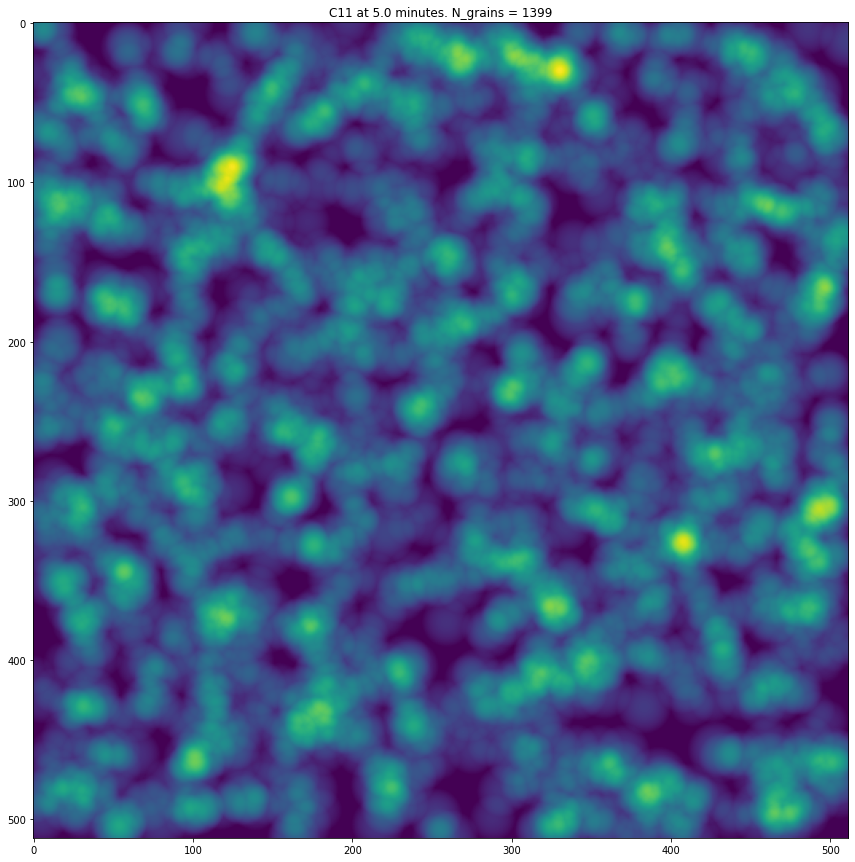

Generating: C11 at 14.0 minutes. N_grains = 896


100%|█████████████████████████████████████████████████████████████████████████████████| 896/896 [02:22<00:00,  6.31it/s]


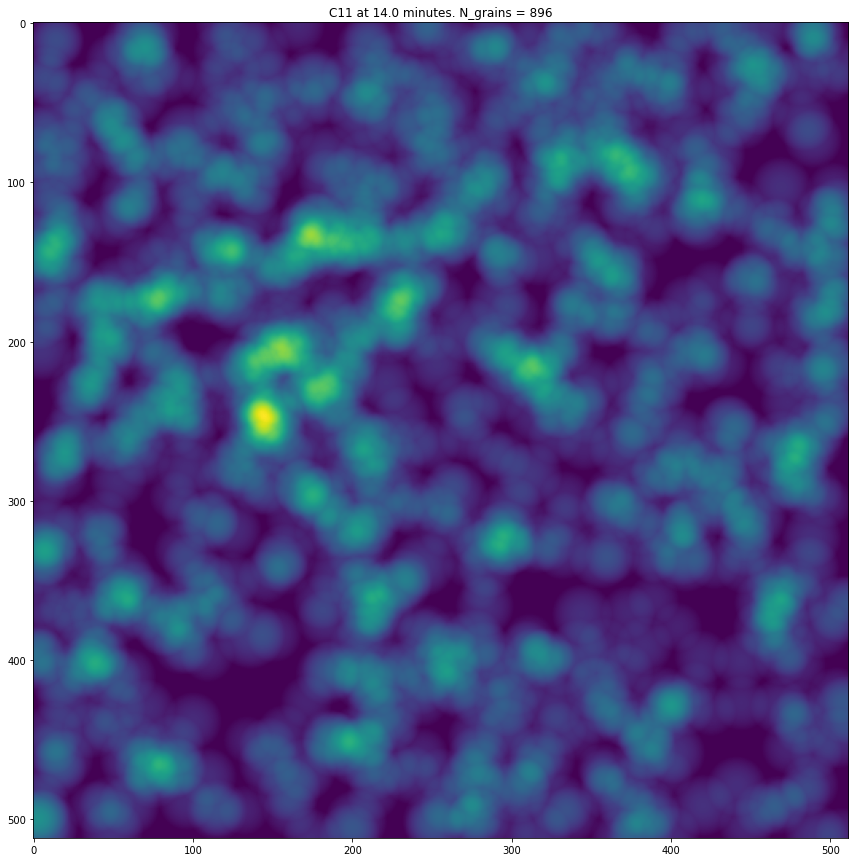

Generating: C11 at 31.0 minutes. N_grains = 812


100%|█████████████████████████████████████████████████████████████████████████████████| 812/812 [01:54<00:00,  7.12it/s]


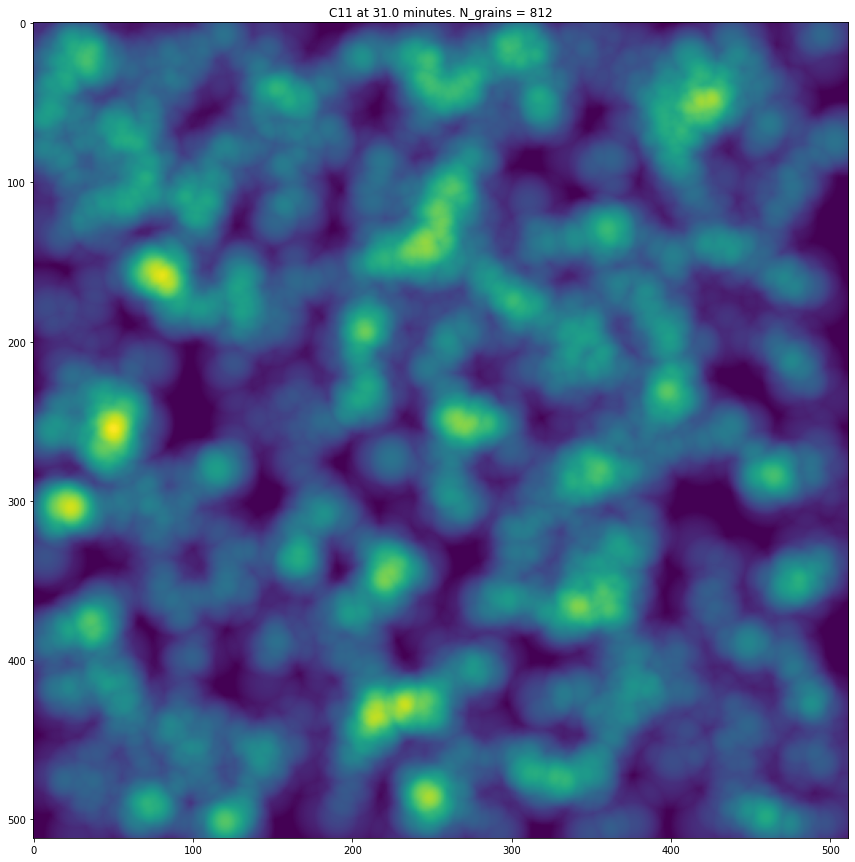

Generating: C11 at 77.0 minutes. N_grains = 705


100%|█████████████████████████████████████████████████████████████████████████████████| 705/705 [01:22<00:00,  8.55it/s]


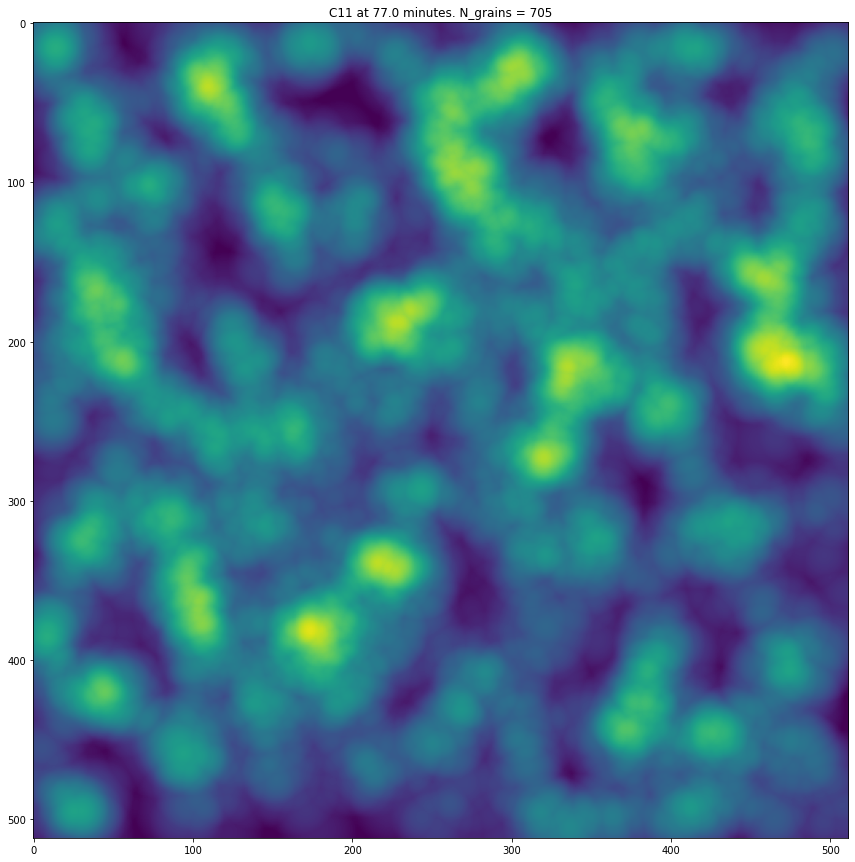

Generating: C11 at 130.0 minutes. N_grains = 677


100%|█████████████████████████████████████████████████████████████████████████████████| 677/677 [01:15<00:00,  8.94it/s]


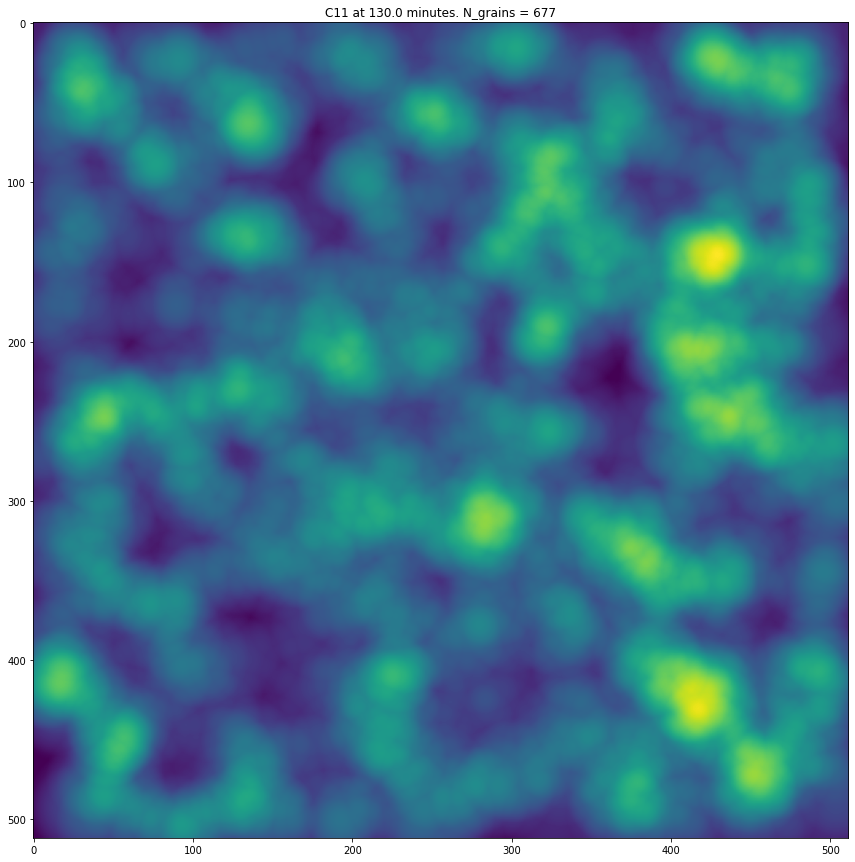

Generating: C11OH at 4.0 minutes. N_grains = 878


100%|█████████████████████████████████████████████████████████████████████████████████| 878/878 [01:37<00:00,  9.05it/s]


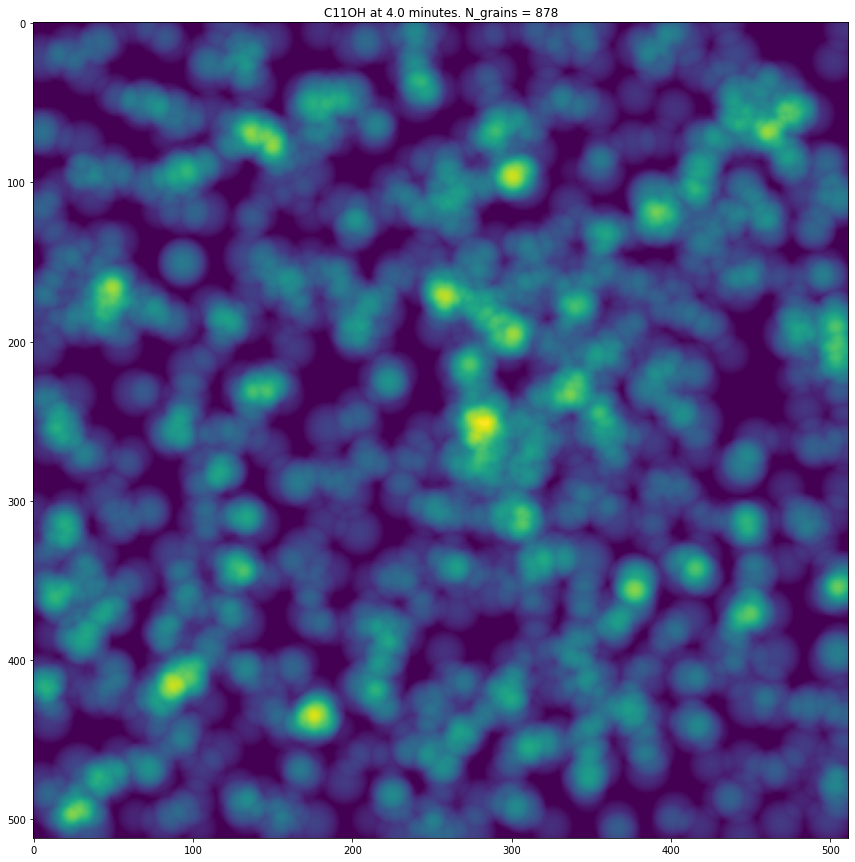

Generating: C11OH at 18.0 minutes. N_grains = 2336


100%|███████████████████████████████████████████████████████████████████████████████| 2336/2336 [04:15<00:00,  9.16it/s]


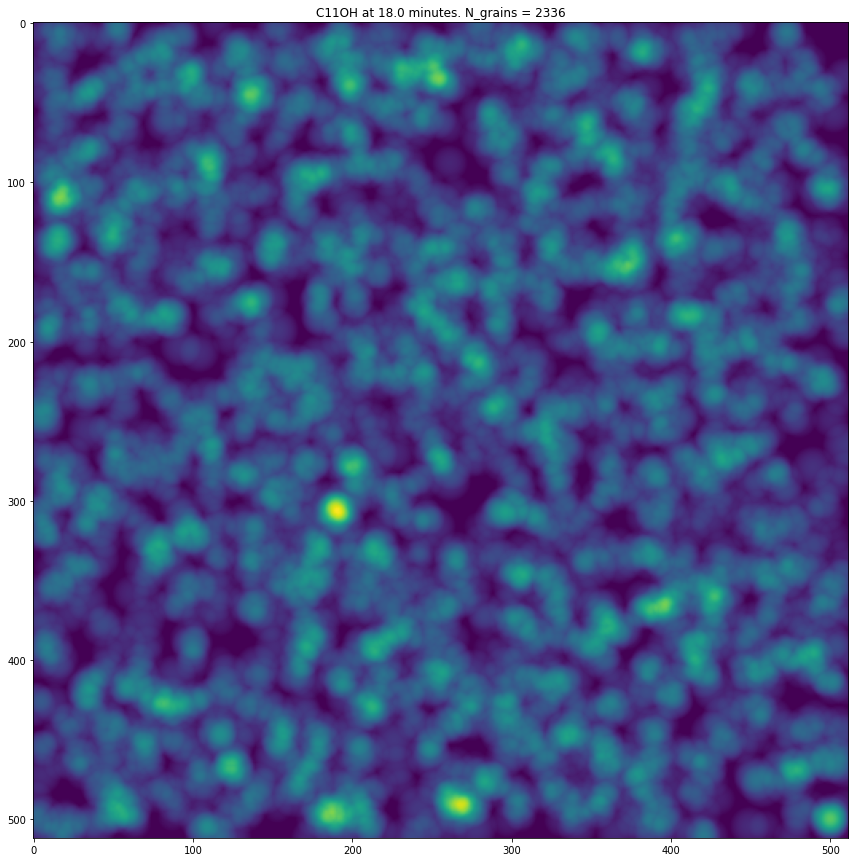

Generating: C11OH at 66.0 minutes. N_grains = 549


100%|█████████████████████████████████████████████████████████████████████████████████| 549/549 [01:00<00:00,  9.07it/s]


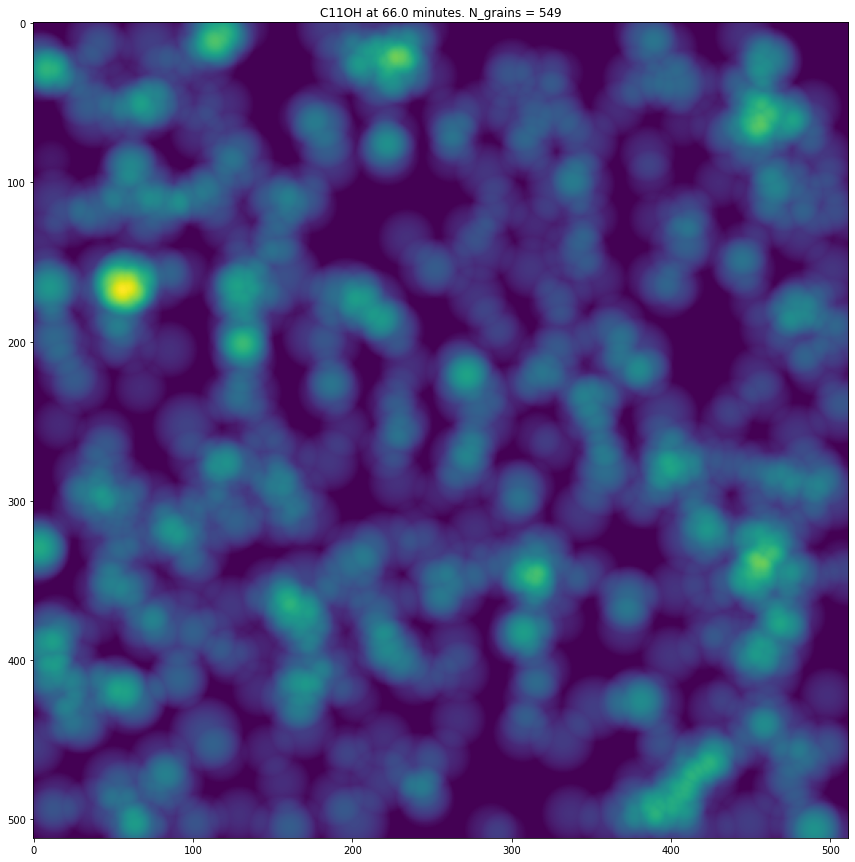

Generating: C11OH at 100.0 minutes. N_grains = 1306


100%|███████████████████████████████████████████████████████████████████████████████| 1306/1306 [02:22<00:00,  9.14it/s]


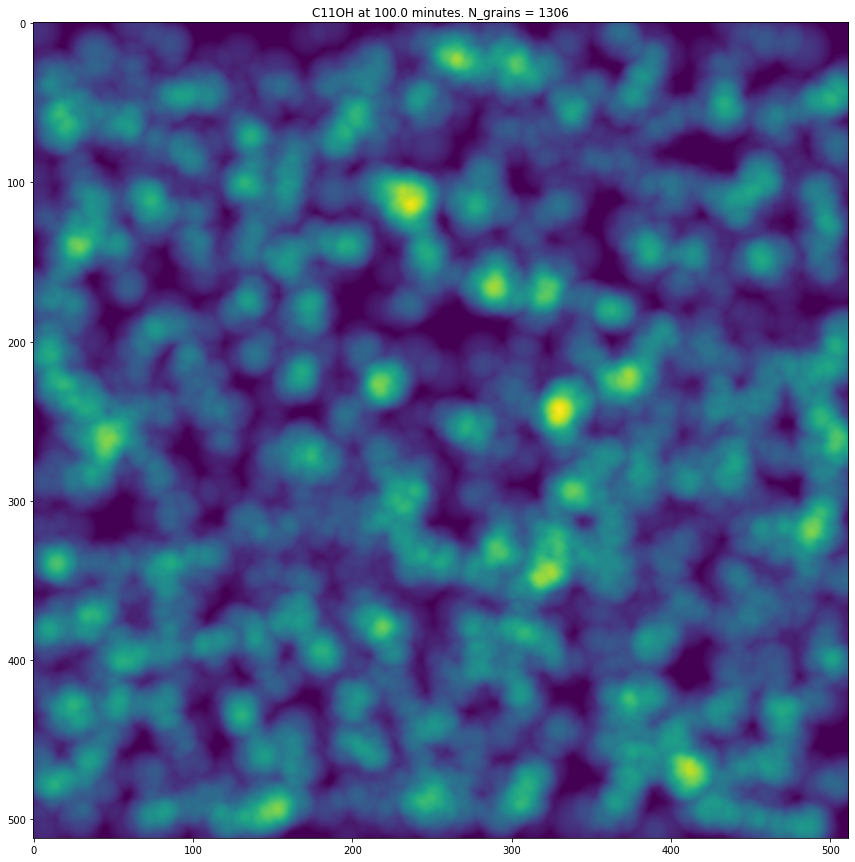

Generating: C11NF at 6.0 minutes. N_grains = 1200


100%|███████████████████████████████████████████████████████████████████████████████| 1200/1200 [02:11<00:00,  9.15it/s]


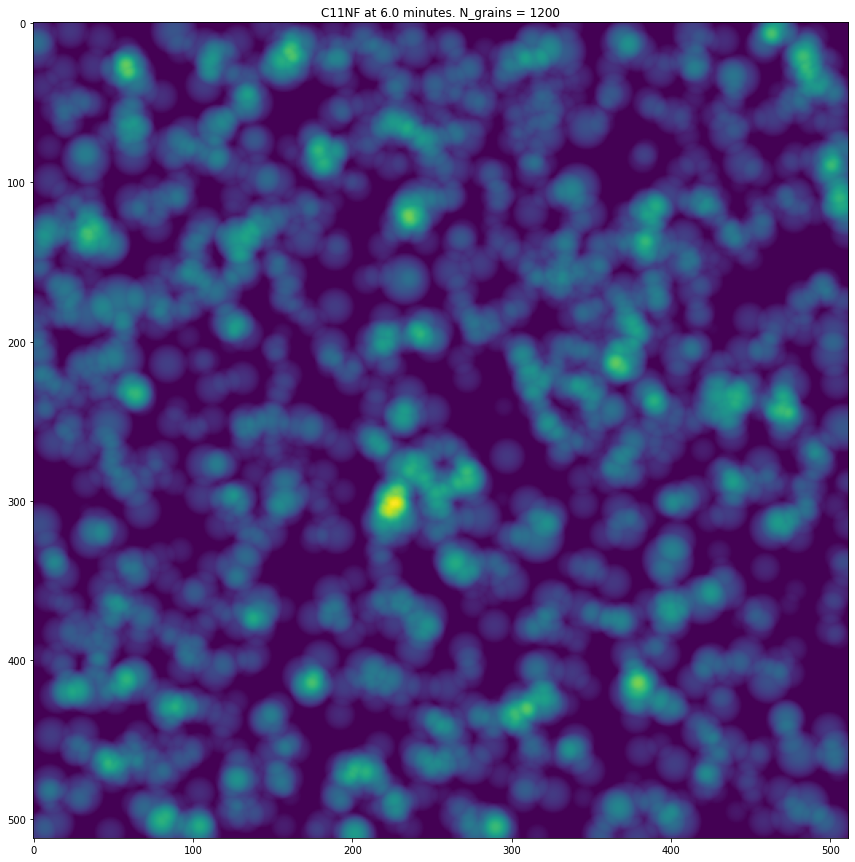

Generating: C11NF at 23.0 minutes. N_grains = 368


100%|█████████████████████████████████████████████████████████████████████████████████| 368/368 [00:40<00:00,  9.17it/s]


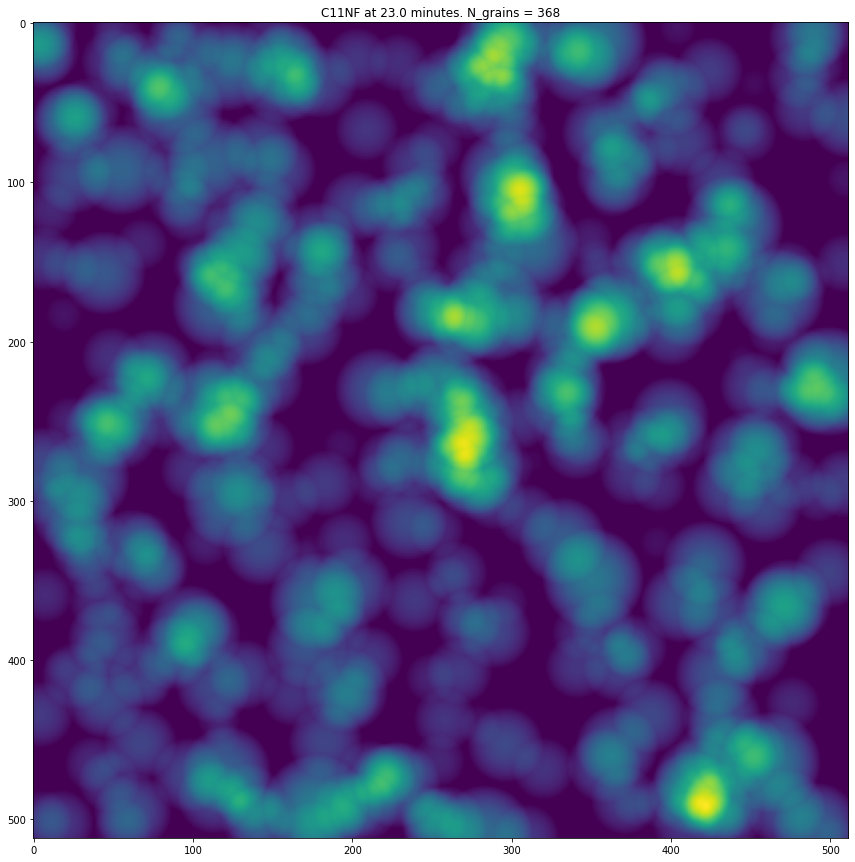

Generating: C11NF at 51.0 minutes. N_grains = 364


100%|█████████████████████████████████████████████████████████████████████████████████| 364/364 [00:41<00:00,  8.74it/s]


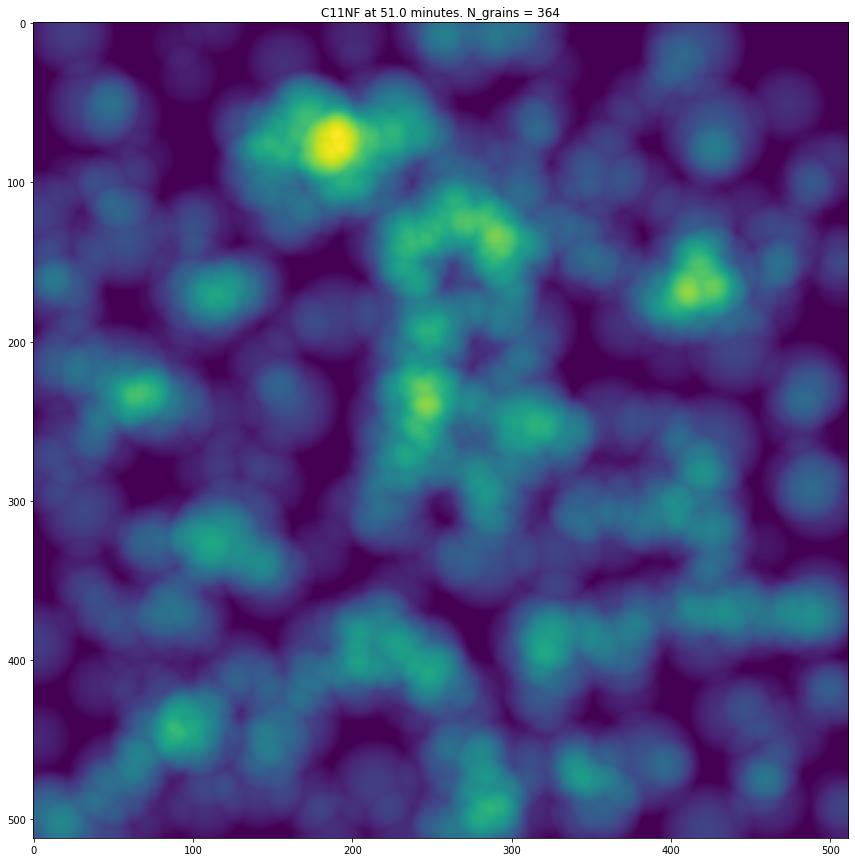

Generating: C11NF at 84.0 minutes. N_grains = 365


100%|█████████████████████████████████████████████████████████████████████████████████| 365/365 [00:44<00:00,  8.28it/s]


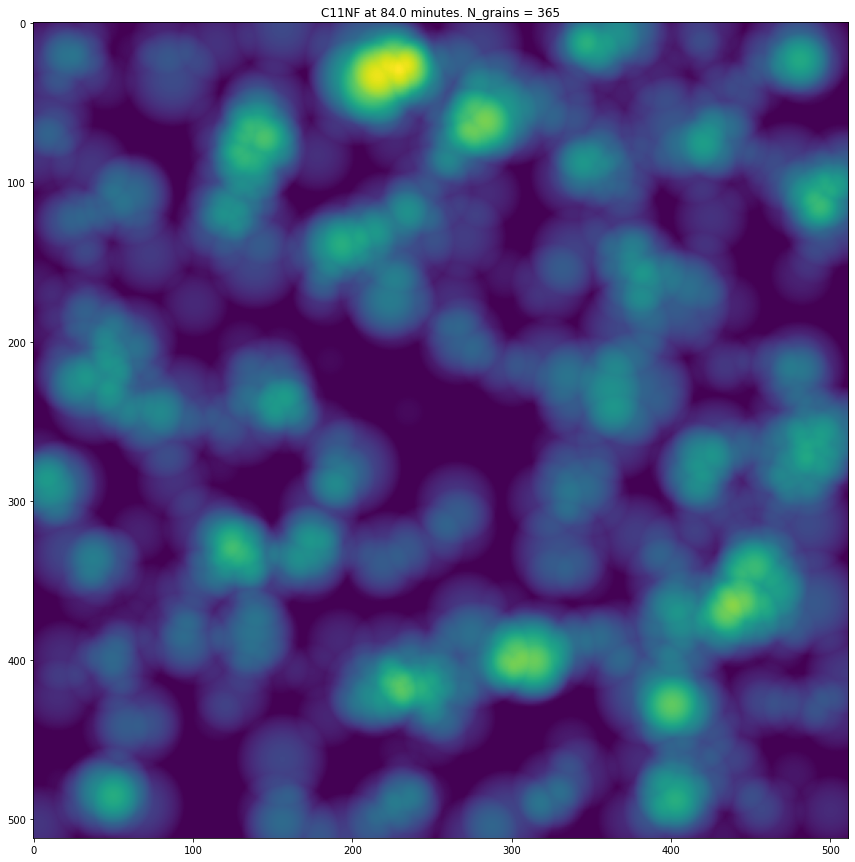

Generating: C11NF at 102.0 minutes. N_grains = 369


100%|█████████████████████████████████████████████████████████████████████████████████| 369/369 [00:41<00:00,  8.91it/s]


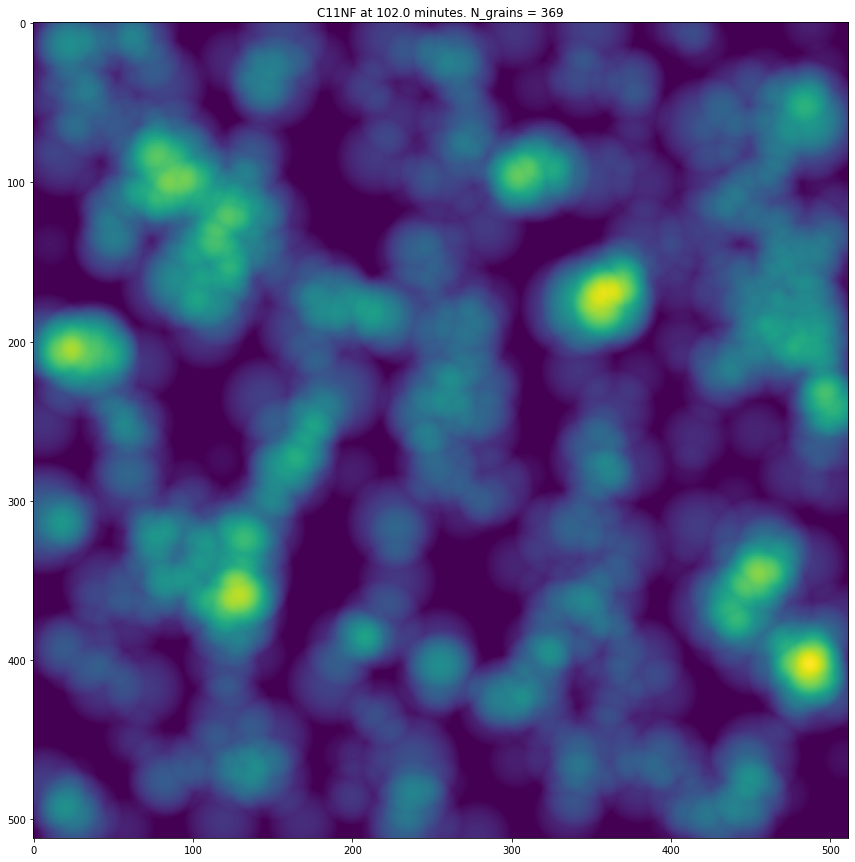

In [16]:
generate_data_Hemisphere(statistical_data, names_df, 512)